# Import Libraries

In [1]:
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

# Import Dataset

using pd.read_csv

In [2]:
df = pd.read_csv(r'C:\Users\nxf73621\Desktop\Stuff\Training\Python\Projects\Movie Industry Analysis\movies.csv')

In [3]:
df.head(15)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000.0,39754601.0,Paramount Pictures,95.0
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000.0,115229890.0,Universal Pictures,133.0
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000.0,23402427.0,Chartoff-Winkler Productions,129.0
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000.0,108185706.0,Dovemead Films,127.0
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000.0,15795189.0,United Artists,100.0


# Cleaning Dataset

In [4]:
 df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7591 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    5497 non-null   float64
 12  gross     7479 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


drop empty rows

In [5]:
df = df.dropna()

In [6]:
 df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5421 entries, 0 to 7652
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      5421 non-null   object 
 1   rating    5421 non-null   object 
 2   genre     5421 non-null   object 
 3   year      5421 non-null   int64  
 4   released  5421 non-null   object 
 5   score     5421 non-null   float64
 6   votes     5421 non-null   float64
 7   director  5421 non-null   object 
 8   writer    5421 non-null   object 
 9   star      5421 non-null   object 
 10  country   5421 non-null   object 
 11  budget    5421 non-null   float64
 12  gross     5421 non-null   float64
 13  company   5421 non-null   object 
 14  runtime   5421 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 677.6+ KB


rename column using .rename

In [7]:
df.rename(columns={'released':'released_date'},inplace=True)

Split Date Column using .str.split

In [8]:
df[['released_date','released_year']] = df['released_date'].str.split('(', n=0, expand=True)

In [148]:
df['released_year'] = df['released_year'].str.replace(')','',regex=False)
# remove ) from released year column
df.head()

,name,rating,genre,year,released_date,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,1970-01-01 00:00:00.000002009
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,1970-01-01 00:00:00.000002019
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1970-01-01 00:00:00.000001997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,1970-01-01 00:00:00.000002015
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,1970-01-01 00:00:00.000002018


Convert to datetime using pd.to_datetime

In [33]:
df['released_date'] =pd.to_datetime(df['released_date'])

In [11]:
df['released_date'].head()

0   1980-06-13
1   1980-07-02
2   1980-06-20
3   1980-07-02
4   1980-07-25
Name: released_date, dtype: datetime64[ns]

In [12]:
df.dtypes
# checking data types

name                     object
rating                   object
genre                    object
year                      int64
released_date    datetime64[ns]
score                   float64
votes                   float64
director                 object
writer                   object
star                     object
country                  object
budget                  float64
gross                   float64
company                  object
runtime                 float64
released_year            object
dtype: object

In [149]:
# changing data types to integer
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')
df.head()

,name,rating,genre,year,released_date,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,1970-01-01 00:00:00.000002009
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,1970-01-01 00:00:00.000002019
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1970-01-01 00:00:00.000001997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,1970-01-01 00:00:00.000002015
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,1970-01-01 00:00:00.000002018


Create new year column with pd.DatetimeIndex

In [15]:
df['released_year'] = pd.DatetimeIndex(df.released_date).year

In [16]:
df

,name,rating,genre,year,released_date,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
0,The Shining,R,Drama,1980,1980-06-13,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,1980-07-02,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,1980-06-20,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,1980-07-02,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,1980-07-25,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,2020-01-17,6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.0,2020
7649,Sonic the Hedgehog,PG,Action,2020,2020-02-14,6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.0,2020
7650,Dolittle,PG,Adventure,2020,2020-01-17,5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.0,2020
7651,The Call of the Wild,PG,Adventure,2020,2020-02-21,6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.0,2020


Sort rows by gross profit using .sort_values

In [17]:
df.sort_values(by=['gross'], inplace=True, ascending=False)

In [22]:
df

,name,rating,genre,year,released_date,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019,2019-07-19,6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015,2015-06-12,7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012,2012-05-04,8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015,2015-04-03,7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019,2019-11-22,6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019


In [19]:
# show full table
pd.set_option('display.max_rows', None)

In [20]:
df['name'].value_counts(ascending=False)

Hercules                                                                               3
Crash                                                                                  2
Teenage Mutant Ninja Turtles                                                           2
Halloween                                                                              2
A Nightmare on Elm Street                                                              2
Hamlet                                                                                 2
Rampage                                                                                2
The Fog                                                                                2
The Hitcher                                                                            2
Heat                                                                                   2
Legend                                                                                 2
Overboard            

Cheking if data has duplicates

In [23]:
# Display duplicate row values for movie name and release year
df[df[['name','released_year']].duplicated() == True]

,name,rating,genre,year,released_date,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
4212,No Good Deed,R,Crime,2002,2014-11-20,5.4,7100.0,Bob Rafelson,Dashiell Hammett,Samuel L. Jackson,Germany,12000000,1440653,ApolloMedia Distribution,97.0,2014


In [24]:
df.loc[df['name'] == 'No Good Deed']

,name,rating,genre,year,released_date,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
6617,No Good Deed,PG-13,Thriller,2014,2014-09-12,5.6,20000.0,Sam Miller,Aimee Lagos,Taraji P. Henson,United States,13200000,54323210,Screen Gems,84.0,2014
4212,No Good Deed,R,Crime,2002,2014-11-20,5.4,7100.0,Bob Rafelson,Dashiell Hammett,Samuel L. Jackson,Germany,12000000,1440653,ApolloMedia Distribution,97.0,2014


Both movies are different, the release date is incorrect. Let's update the released_date & released_date values. Use .at method: 
dataframe.at[index,'column-name']='new value'

In [31]:
df.at[4212,'released_date']='2012-11-20'

In [29]:
df.at[4212,'released_year']=2012

In [34]:
df.loc[df['name'] == 'No Good Deed']

,name,rating,genre,year,released_date,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
6617,No Good Deed,PG-13,Thriller,2014,2014-09-12,5.6,20000.0,Sam Miller,Aimee Lagos,Taraji P. Henson,United States,13200000,54323210,Screen Gems,84.0,2014
4212,No Good Deed,R,Crime,2002,2012-11-20,5.4,7100.0,Bob Rafelson,Dashiell Hammett,Samuel L. Jackson,Germany,12000000,1440653,ApolloMedia Distribution,97.0,2012


In [35]:
df['released_year'] =pd.to_datetime(df['released_year'])

In [38]:
# cheking the distinct company name for typos or formating issues 
df['company'].drop_duplicates().sort_values(ascending=True)

4345                      "DIA" Productions GmbH & Co. KG
7525                  "Weathering With You" Film Partners
3024                                      .406 Production
2929                                        1492 Pictures
385                                      1818 Productions
4412                                     19 Entertainment
7109                                           1978 Films
6517                     1984 Private Defense Contractors
4151                                         2 Loop Films
7489                                    2.0 Entertainment
5195                                         2.4.7. Films
4559                                     2003 Productions
7651                                 20th Century Studios
6528                                21 Laps Entertainment
1700                        21st Century Film Corporation
2584                                   21st Century Films
4118                                25th Hour Productions
5597          

# Finding Correlations In Data

Scatter plot of budget vs gross revenue

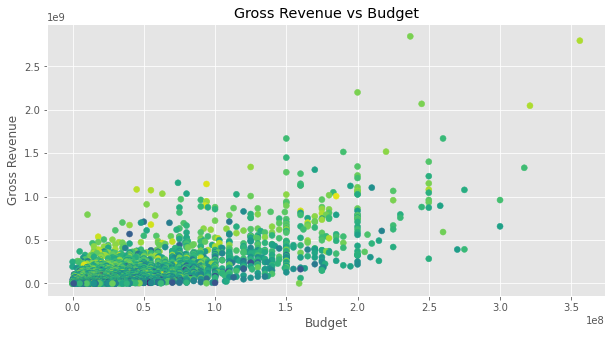

In [104]:
plt.figure(figsize=(10, 5))
plt.scatter(x=df.budget,y=df.gross,c=df.score)
plt.title('Gross Revenue vs Budget')
plt.xlabel('Budget')
plt.ylabel('Gross Revenue');

Regression plot of Budget vs Gross revenue using seaborn

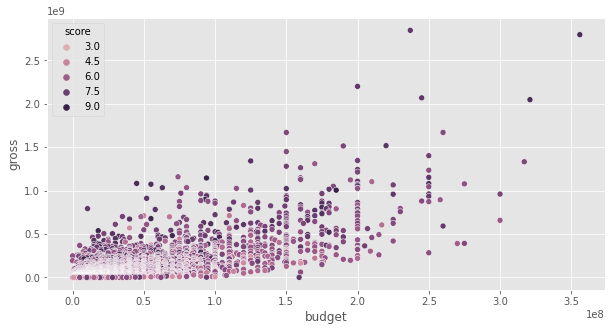

In [117]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x='budget',y='gross',hue='score',data=df);

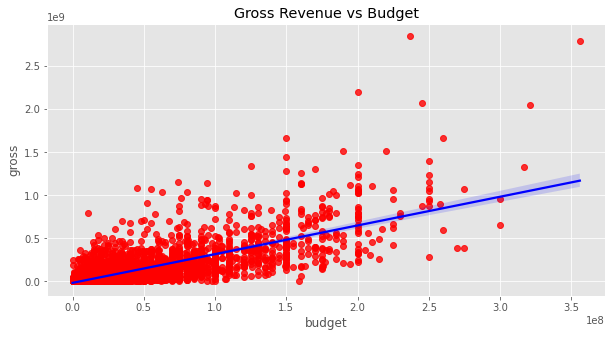

In [118]:
import seaborn as sns
plt.figure(figsize=(10, 5))
sns.regplot(x='budget',y='gross',color='b',data=df,scatter_kws={'color':'red'},line_kws={'color':'blue'})
plt.title('Gross Revenue vs Budget');

Budget shows positive correlation to gross revenue. But by how much?

In [119]:
# to check correlation from numerical data
# this is using the pearson method by default, other 2 are kendall & spearman
df.corr()

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


Number of votes & budget is highly correlated to gross revenue

In [121]:
# using kendall method
df.corr(method='kendall')

,year,score,votes,budget,gross,runtime
year,1.000000,0.039389,0.296512,0.220833,0.239539,0.064824
score,0.039389,1.000000,0.350185,-0.006406,0.124943,0.292254
votes,0.296512,0.350185,1.000000,0.346274,0.553625,0.205344
budget,0.220833,-0.006406,0.346274,1.000000,0.512057,0.231278
gross,0.239539,0.124943,0.553625,0.512057,1.000000,0.176979
runtime,0.064824,0.292254,0.205344,0.231278,0.176979,1.000000


In [122]:
# using spearman method
df.corr(method='spearman')

,year,score,votes,budget,gross,runtime
year,1.000000,0.057741,0.427623,0.312886,0.351045,0.095444
score,0.057741,1.000000,0.495409,-0.009971,0.183192,0.412155
votes,0.427623,0.495409,1.000000,0.493461,0.745793,0.300621
budget,0.312886,-0.009971,0.493461,1.000000,0.692958,0.330794
gross,0.351045,0.183192,0.745793,0.692958,1.000000,0.257400
runtime,0.095444,0.412155,0.300621,0.330794,0.257400,1.000000


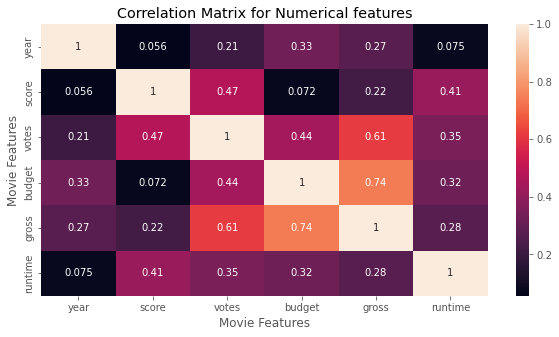

In [125]:
correlation_matrix = df.corr(method='pearson')
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True);
plt.title('Correlation Matrix for Numerical features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features');

In [127]:
# covert object columns to numeric type to run correlation
# create loop to covert object to category type 
# then use .cat.codes to convert category type to numeric values

df_numerized = df.copy()

for col_names in df_numerized.columns:
    if (df_numerized[col_names].dtype == 'object'):
        df_numerized[col_names] = df_numerized[col_names].astype('category')
        df_numerized[col_names] = df_numerized[col_names].cat.codes

df_numerized

,name,rating,genre,year,released_date,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
5445,386,5,0,2009,2009-12-18,7.8,1100000.0,785,1263,1534,47,237000000,2847246203,1382,162.0,1970-01-01 00:00:00.000002009
7445,388,5,0,2019,2019-04-26,8.4,903000.0,105,513,1470,47,356000000,2797501328,983,181.0,1970-01-01 00:00:00.000002019
3045,4909,5,6,1997,1997-12-19,7.8,1100000.0,785,1263,1073,47,200000000,2201647264,1382,194.0,1970-01-01 00:00:00.000001997
6663,3643,5,0,2015,2015-12-18,7.8,876000.0,768,1806,356,47,245000000,2069521700,945,138.0,1970-01-01 00:00:00.000002015
7244,389,5,0,2018,2018-04-27,8.4,897000.0,105,513,1470,47,321000000,2048359754,983,149.0,1970-01-01 00:00:00.000002018
7480,4388,4,2,2019,2019-07-19,6.9,222000.0,1012,1361,457,47,260000000,1670727580,1423,118.0,1970-01-01 00:00:00.000002019
6653,2117,5,0,2015,2015-06-12,7.0,593000.0,335,2523,293,47,150000000,1670516444,1397,124.0,1970-01-01 00:00:00.000002015
6043,3878,5,0,2012,2012-05-04,8.0,1300000.0,1060,1646,1470,47,220000000,1518815515,983,143.0,1970-01-01 00:00:00.000002012
6646,1541,5,0,2015,2015-04-03,7.1,370000.0,809,481,1785,47,190000000,1515341399,1397,137.0,1970-01-01 00:00:00.000002015
7494,1530,4,2,2019,2019-11-22,6.8,148000.0,277,1383,1036,47,150000000,1450026933,1422,103.0,1970-01-01 00:00:00.000002019


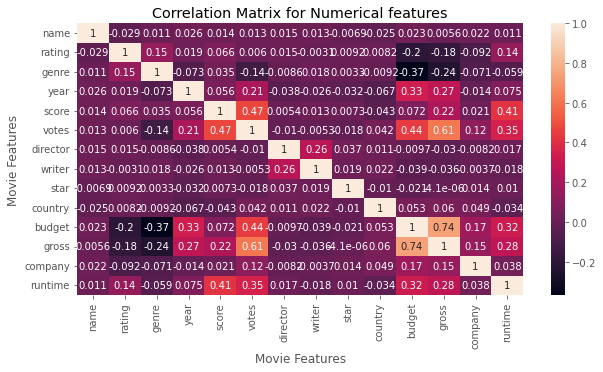

In [129]:
correlation_matrix = df_numerized.corr(method='pearson')
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True);
plt.title('Correlation Matrix for Numerical features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features');

In [130]:
correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

name      name        1.000000
          rating     -0.029234
          genre       0.010996
          year        0.025542
          score       0.014450
          votes       0.012615
          director    0.015246
          writer      0.012880
          star       -0.006882
          country    -0.025490
          budget      0.023392
          gross       0.005639
          company     0.021697
          runtime     0.010850
rating    name       -0.029234
          rating      1.000000
          genre       0.147796
          year        0.019499
          score       0.065983
          votes       0.006031
          director    0.014656
          writer     -0.003149
          star        0.009196
          country     0.008230
          budget     -0.203946
          gross      -0.181906
          company    -0.092357
          runtime     0.140792
genre     name        0.010996
          rating      0.147796
          genre       1.000000
          year       -0.073167
        

In [131]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre     budget     -0.368523
budget    genre      -0.368523
gross     genre      -0.244101
genre     gross      -0.244101
budget    rating     -0.203946
rating    budget     -0.203946
          gross      -0.181906
gross     rating     -0.181906
genre     votes      -0.135990
votes     genre      -0.135990
rating    company    -0.092357
company   rating     -0.092357
year      genre      -0.073167
genre     year       -0.073167
company   genre      -0.071334
genre     company    -0.071334
country   year       -0.066748
year      country    -0.066748
genre     runtime    -0.059237
runtime   genre      -0.059237
score     country    -0.043051
country   score      -0.043051
budget    writer     -0.039466
writer    budget     -0.039466
director  year       -0.038354
year      director   -0.038354
writer    gross      -0.035885
gross     writer     -0.035885
runtime   country    -0.034477
country   runtime    -0.034477
year      star       -0.032157
star      year       -0.032157
director

In [134]:
high_corr = sorted_pairs[(sorted_pairs)>0.5]
high_corr

gross     votes       0.614751
votes     gross       0.614751
budget    gross       0.740247
gross     budget      0.740247
name      name        1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
director  director    1.000000
votes     votes       1.000000
score     score       1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

Votes and budget have the highest correlation to gross revenue

In [141]:
df['company'].nunique()

1475

In [143]:
#print(df['company'].value_counts())